In [30]:
import os
import pandas as pd
import numpy as np
os.chdir('C:\\Users\\howar\\Documents\\Machine_Learning1\\home-credit-default-risk')

In [47]:
with open('application_train.csv') as file:
    train = pd.read_csv(file)
train.head()



,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


In [48]:
train.shape

(307511, 122)

training data : 307,511 loans with 122 unique features

In [15]:
train.describe()

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,307511.000000,307511.000000,307511.000000,3.075110e+05,3.075110e+05,307499.000000,3.072330e+05,307511.000000,307511.000000,307511.000000,...,307511.000000,307511.000000,307511.000000,307511.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000
mean,278180.518577,0.080729,0.417052,1.687979e+05,5.990260e+05,27108.573909,5.383962e+05,0.020868,-16036.995067,63815.045904,...,0.008130,0.000595,0.000507,0.000335,0.006402,0.007000,0.034362,0.267395,0.265474,1.899974
std,102790.175348,0.272419,0.722121,2.371231e+05,4.024908e+05,14493.737315,3.694465e+05,0.013831,4363.988632,141275.766519,...,0.089798,0.024387,0.022518,0.018299,0.083849,0.110757,0.204685,0.916002,0.794056,1.869295
min,100002.000000,0.000000,0.000000,2.565000e+04,4.500000e+04,1615.500000,4.050000e+04,0.000290,-25229.000000,-17912.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,189145.500000,0.000000,0.000000,1.125000e+05,2.700000e+05,16524.000000,2.385000e+05,0.010006,-19682.000000,-2760.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,278202.000000,0.000000,0.000000,1.471500e+05,5.135310e+05,24903.000000,4.500000e+05,0.018850,-15750.000000,-1213.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
75%,367142.500000,0.000000,1.000000,2.025000e+05,8.086500e+05,34596.000000,6.795000e+05,0.028663,-12413.000000,-289.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000
max,456255.000000,1.000000,19.000000,1.170000e+08,4.050000e+06,258025.500000,4.050000e+06,0.072508,-7489.000000,365243.000000,...,1.000000,1.000000,1.000000,1.000000,4.000000,9.000000,8.000000,27.000000,261.000000,25.000000


In [23]:
pd.options.display.max_rows = 200
print(train.dtypes)
print(train.info())

SK_ID_CURR                        int64
TARGET                            int64
NAME_CONTRACT_TYPE               object
CODE_GENDER                      object
FLAG_OWN_CAR                     object
FLAG_OWN_REALTY                  object
CNT_CHILDREN                      int64
AMT_INCOME_TOTAL                float64
AMT_CREDIT                      float64
AMT_ANNUITY                     float64
AMT_GOODS_PRICE                 float64
NAME_TYPE_SUITE                  object
NAME_INCOME_TYPE                 object
NAME_EDUCATION_TYPE              object
NAME_FAMILY_STATUS               object
NAME_HOUSING_TYPE                object
REGION_POPULATION_RELATIVE      float64
DAYS_BIRTH                        int64
DAYS_EMPLOYED                     int64
DAYS_REGISTRATION               float64
DAYS_ID_PUBLISH                   int64
OWN_CAR_AGE                     float64
FLAG_MOBIL                        int64
FLAG_EMP_PHONE                    int64
FLAG_WORK_PHONE                   int64


In [54]:
ints = train.dtypes[train.dtypes == np.int64]
intslist = list(ints.index)

floats = train.dtypes[train.dtypes == np.float64]
floatslist = list(floats.index)

nominals = train.dtypes[train.dtypes == np.object]
nominalslist = list(nominals.index)

Trying to visualize to find relationships

In [56]:
import plotly.express as px
df = complete_train
fig = px.scatter_matrix(df,
    dimensions = intslist,
    color="TARGET")
fig.show()

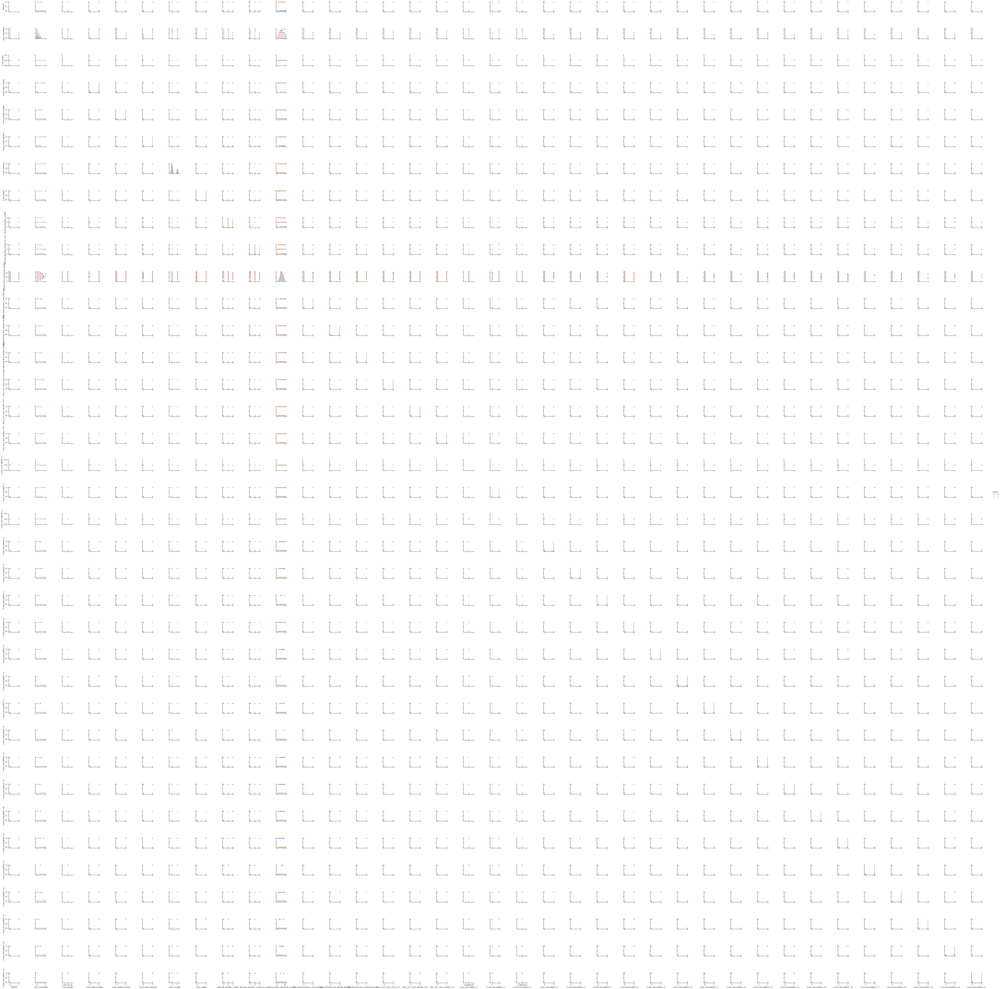

In [60]:
import seaborn as sns
sns.set(style="ticks")

### VERY INEFFICIENT, but useful, use if time permits
#ints_df = complete_train[intslist]
#sns.pairplot(ints_df, hue="TARGET")

stuff = ints_df.iloc[:,1:3]
stuff2 = ints_df.iloc[:,6:]
view = pd.concat([stuff, stuff2], axis = 1)

sns.pairplot(view, hue = 'TARGET')

In [61]:
defaults = view.groupby(by = ['TARGET']).sum()
defaults.head()

,CNT_CHILDREN,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,...,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21
TARGET,,,,,,,,,,,,,,,,,,,,,
0,4898,8076,8074,1693,8050,2513,1010,16129,15663,98644,...,1,126,41,34,88,2,82,4,9,2
1,285,526,526,123,525,148,71,1117,1094,6329,...,0,1,2,3,1,0,4,1,0,0


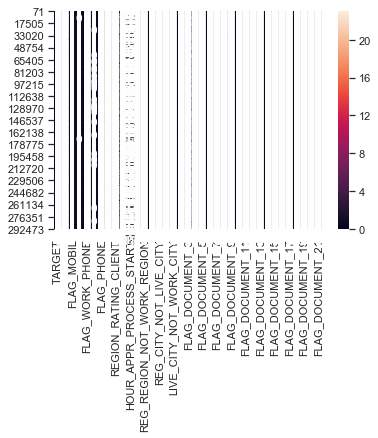

In [68]:
sns.heatmap(view,
            annot=True)


In [22]:
pd.options.display.max_rows = 200
na_vals = train.isna().sum()/len(train)*100
print(na_vals)

SK_ID_CURR                       0.000000
TARGET                           0.000000
NAME_CONTRACT_TYPE               0.000000
CODE_GENDER                      0.000000
FLAG_OWN_CAR                     0.000000
FLAG_OWN_REALTY                  0.000000
CNT_CHILDREN                     0.000000
AMT_INCOME_TOTAL                 0.000000
AMT_CREDIT                       0.000000
AMT_ANNUITY                      0.003902
AMT_GOODS_PRICE                  0.090403
NAME_TYPE_SUITE                  0.420148
NAME_INCOME_TYPE                 0.000000
NAME_EDUCATION_TYPE              0.000000
NAME_FAMILY_STATUS               0.000000
NAME_HOUSING_TYPE                0.000000
REGION_POPULATION_RELATIVE       0.000000
DAYS_BIRTH                       0.000000
DAYS_EMPLOYED                    0.000000
DAYS_REGISTRATION                0.000000
DAYS_ID_PUBLISH                  0.000000
OWN_CAR_AGE                     65.990810
FLAG_MOBIL                       0.000000
FLAG_EMP_PHONE                   0

In [49]:
complete_train = train.dropna(axis = 0)
complete_train.shape

(8602, 122)

In [53]:
import prince
# create FAMD object
famd = prince.FAMD(
    n_components = 4,
    n_iter=3,
    copy = True,
    check_input = True,
    engine = 'auto',
    random_state=42
)
# fit object to data
famd = famd.fit(complete_train.drop('TARGET', axis = 1))
famd.transform(complete_train)
famd.result

TypeError: check_is_fitted() missing 1 required positional argument: 'attributes'

PCA and LDA using sklearn

In [80]:
from sklearn.decomposition import PCA
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
X = view.iloc[:,2:]
Y_train = view.iloc[:,1]


In [74]:
X.head()

,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,...,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21
71,1,1,0,1,0,0,2,2,18,0,...,0,0,0,0,0,0,0,0,0,0
124,1,1,0,1,0,0,2,2,11,0,...,0,0,0,0,0,0,0,0,0,0
152,1,1,0,1,0,0,2,2,13,0,...,0,0,0,0,0,0,0,0,0,0
161,1,1,0,1,1,0,2,2,16,0,...,0,0,0,0,0,0,0,0,0,0
255,1,1,0,1,0,0,1,1,14,1,...,0,0,0,0,0,0,1,0,0,0


In [75]:
Y_train.head()

71     0
124    1
152    0
161    0
255    1
Name: CNT_CHILDREN, dtype: int64

STEPS TO PCA/LDA
1. Scale the data
2. performa PCA/LDA
3. graph 1st two dimensions

In [95]:
# scaling data
X_train = sc.fit_transform(X)

#Y_train = sc.fit_transform(Y)

In [99]:
#LDA
lda = LDA(n_components = 2)
X_lda = lda.fit_transform(X_train, Y_train)
#PCA
pca = PCA(n_components = 2)
x_pca = pca.fit_transform(X_train, Y_train)

C:\Users\howar\Anaconda3\lib\site-packages\sklearn\discriminant_analysis.py:388: UserWarning:

Variables are collinear.



In [97]:
X_lda.shape

(8602, 2)

In [98]:
X_pca.shape

NameError: name 'X_pca' is not defined

In [100]:
#constructing new PCA to investigate the X_pca issue 
#constructing coveriance matrix
cov_mat = np.cov(X_train.T)
# linal.eig function computes eigenvalues
eigen_vals, eigenvecs = np.linalg.eig(cov_mat)
print('\nEigenvalues \n%s' % eigen_vals)


Eigenvalues 
[2.8990207  2.14515906 0.05674638 0.09155201 0.11601998 0.22673139
 1.58029054 1.44449402 0.52504056 0.61247714 1.29091318 1.25684035
 0.75249746 1.20024668 0.81757962 0.84749841 1.14065575 0.92106857
 1.08014198 0.9514809  0.96473776 1.0347692  1.02098709 1.01983591
 1.01565169 0.99151439 0.99618612 1.00309252 0.99830103 1.00176932
 1.00074804 0.99967273 0.         0.         0.        ]


The last 3 eigenvalues are 0. Why?

In [102]:
X.iloc[:,33:].describe

<bound method NDFrame.describe of         FLAG_DOCUMENT_20  FLAG_DOCUMENT_21
71                     0                 0
124                    0                 0
152                    0                 0
161                    0                 0
255                    0                 0
...                  ...               ...
307358                 0                 0
307359                 0                 0
307407                 0                 0
307456                 0                 0
307482                 0                 0

[8602 rows x 2 columns]>

All 8602 values = 0, these are useless in this scenario and can be discarded.
We will continue on to the variance explained.

In [109]:
import matplotlib.pyplot as  plt
# total variance explained
tot = sum(eigen_vals)
var_exp = [(i / tot) for i in
          sorted(eigen_vals, reverse = True)]
cum_var_exp = np.cumsum(var_exp)
len(var_exp)

35

ValueError: shape mismatch: objects cannot be broadcast to a single shape

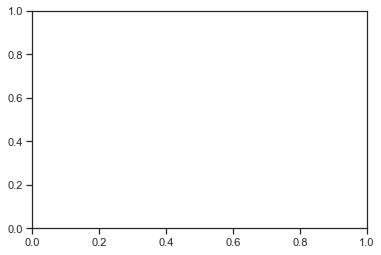

In [110]:
plt.bar(range(1,35), var_exp, alpha = .5, align = 'center',
        label = 'Individual explained variance')
plt.step(range(1,35), cum_var_exp, where = 'mid',
        label= 'Cumulative explained variance')
plt.ylabel('Explained variance ratio')
plt.xlabel('Principal compoenent index')
plt.legend(loc='best')
plt.tight_layout()
plt.show()
"""
~\Anaconda3\lib\site-packages\numpy\lib\stride_tricks.py in _broadcast_shape(*args)
    191     b = np.broadcast(*args[:32])
    192     # unfortunately, it cannot handle 32 or more arguments directly
--> 193     for pos in range(32, len(args), 31):
    194         # ironically, np.broadcast does not properly handle np.broadcast
    195         # objects (it treats them as scalars)
"""

In [112]:
newX = X.iloc[:,1:32]
cov_mat = np.cov(newX.T)
# linal.eig function computes eigenvalues
eigen_vals, eigenvecs = np.linalg.eig(cov_mat)
print('\nEigenvalues \n%s' % eigen_vals)


Eigenvalues 
[1.13008677e+01 5.59245270e-01 3.14623616e-01 2.58193532e-01
 2.43218612e-01 1.23807225e-01 1.05197445e-01 8.14989436e-02
 5.90280442e-02 4.07089288e-02 2.85237829e-02 1.44106237e-02
 1.20550909e-02 9.82466593e-03 1.02082731e-02 1.09286129e-02
 1.09835257e-02 6.45731613e-03 5.12349227e-03 4.63125101e-03
 4.26864458e-03 4.16978088e-03 2.89672921e-03 3.06134903e-03
 3.47152642e-04 2.32110038e-04 2.32436102e-04 1.16044257e-04
 1.16159744e-04 0.00000000e+00 0.00000000e+00]


In [113]:
len(eigen_vals)

31

In [114]:
tot = sum(eigen_vals)
var_exp = [(i / tot) for i in
          sorted(eigen_vals, reverse = True)]
cum_var_exp = np.cumsum(var_exp)
len(var_exp)

31

ValueError: shape mismatch: objects cannot be broadcast to a single shape

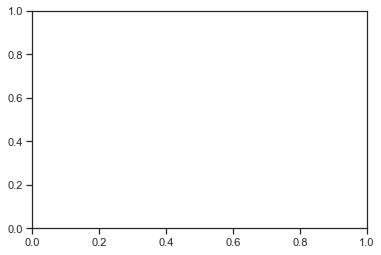

In [118]:
plt.bar(range(1,31), var_exp, alpha = .5, align = 'center',
        label = 'Individual explained variance')
#plt.step(range(1,35), cum_var_exp, where = 'mid',
#        label= 'Cumulative explained variance')
#plt.ylabel('Explained variance ratio')
#plt.xlabel('Principal compoenent index')
#plt.legend(loc='best')
#plt.tight_layout()
#plt.show()